In [1]:
from astropy.io import fits
from processing_functions import *
import matplotlib.pyplot as plt
import matplotlib
params={
    'text.usetex':True,
    'font.family':'serif',
    'xtick.minor.visible':True,
    'ytick.minor.visible':True,
    'xtick.top':True,
    'ytick.left':True,
    'ytick.right':True,
    'xtick.direction':'out',
    'ytick.direction':'out',
    'xtick.minor.size':2.5,
    'xtick.major.size':5,
    'ytick.minor.size':2.5,
    'ytick.major.size':5,
    'axes.axisbelow':True
}
matplotlib.rcParams.update(params)
%matplotlib inline

# **Time binsize = 1s**

In [2]:
lc1 = 'data/AS1A06_002T02_9000003206_21631cztM0_level2_quad_clean_Q0.lc'
lc2 = 'data/AS1A06_002T02_9000003206_21631cztM0_level2_quad_clean_Q1.lc'
lc3 = 'data/AS1A06_002T02_9000003206_21631cztM0_level2_quad_clean_Q2.lc'
lc4 = 'data/AS1A06_002T02_9000003206_21631cztM0_level2_quad_clean_Q3.lc'

lc1_data = fits.open(lc1)[1].data
lc2_data = fits.open(lc2)[1].data
lc3_data = fits.open(lc3)[1].data
lc4_data = fits.open(lc4)[1].data

**Marking where the grb starts and ends in each quadrant**

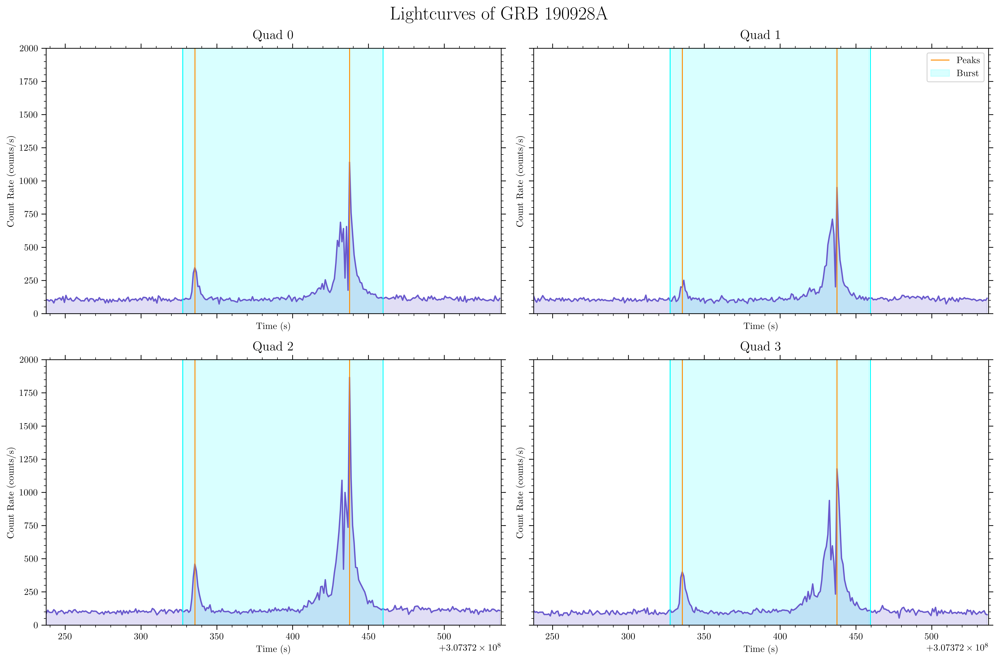

In [3]:
max = int(np.where(lc1_data['RATE'] == np.max(lc1_data['RATE']))[0])
start = max-110
end = max+22

l = [lc1_data, lc2_data, lc3_data, lc4_data]


fig, ax = plt.subplots(2,2, sharex=True, sharey=True, figsize=(15, 10), dpi=500)

for i in range(4):
    ax[i//2,i%2].plot(l[i]['TIME'][start-90:end+78], l[i]['RATE'][start-90:end+78], color='slateblue')
    ax[i//2, i%2].set_ylim(0, 2000)
    ax[i//2, i%2].set_xlim(l[i]['TIME'][start-90], l[i]['TIME'][end+78])
    ax[i//2,i%2].fill_between(l[i]['TIME'][start-90:end+78], l[i]['RATE'][start-90:end+78], color='slateblue', alpha=0.2)
    ax[i//2,i%2].vlines(x = [l[i]['TIME'][max], l[i]['TIME'][max-102]],ymin=0, ymax=2000, color = 'darkorange', label = 'Peaks', linewidth=1)
    ax[i//2,i%2].vlines(x = [l[i]['TIME'][end], l[i]['TIME'][start]], ymin=0, ymax=2000, color = 'cyan', linewidth=1)
    ax[i//2,i%2].fill_between(l[i]['TIME'][start:end], 2000, color='cyan', alpha=0.15, label='Burst')
    ax[i//2,i%2].set_title('Quad '+str(i), fontsize=14, pad=10)
    ax[i//2,i%2].set_xlabel('Time (s)')
    ax[i//2,i%2].set_ylabel('Count Rate (counts/s)')
    if i//2==0 and i%2==1:
        ax[i//2,i%2].legend()
fig.suptitle('Lightcurves of GRB 190928A', fontsize=20)
fig.tight_layout()

In [4]:
#time of grb
duration = lc4_data['TIME'][end] - lc4_data['TIME'][start]
print("The duration of the GRB is " + str(duration) + " seconds")

The duration of the GRB is 132.0 seconds


**Filtering and detrending the data**

In [5]:
lc1_filtered, *_ = filter_and_detrend(lc1, start, end, 3)
lc2_filtered, *_ = filter_and_detrend(lc2, start, end, 3)
lc3_filtered, *_ = filter_and_detrend(lc3, start, end, 3)
lc4_filtered, *_ = filter_and_detrend(lc4, start, end, 3)

l_f = [lc1_filtered, lc2_filtered, lc3_filtered, lc4_filtered]

fig, ax = plt.subplots(4,1, sharex=True, sharey=True, figsize=(16,18), dpi=500)

for i in range(4):
    ax[i].plot(l_f[i]['TIME'], l_f[i]['RATE'], color='slateblue')
    ax[i].set_title('Quad '+str(i), fontsize=15, pad=10)
    ax[i].set_xlabel('Time (s)', fontsize=13)
    ax[i].set_ylabel('Count Rate (counts/s)', fontsize=13)
    ax[i].set_xlim(np.min(l_f[i]['TIME']), np.max(l_f[i]['TIME']))
fig.suptitle('Filtered Lightcurves of GRB 190928A', fontsize=20, y=0.99)
fig.tight_layout()

**Estimating the noise and calculating SNR**

Method 1 - Using RMS value of noise and peak value of signal
The SNR of the GRB in Quad 0 is 92.2635
The SNR of the GRB in Quad 1 is 77.45316
The SNR of the GRB in Quad 2 is 170.2916
The SNR of the GRB in Quad 3 is 102.11951


Method 2 - Using mean of absolute value of noise and peak value of signal
The SNR of the GRB in Quad 0 is 116.68761
The SNR of the GRB in Quad 1 is 96.8198
The SNR of the GRB in Quad 2 is 212.06438
The SNR of the GRB in Quad 3 is 128.68777


Method 3 - Adding the counts in the peak and noise regions
The SNR of the GRB in Quad 0 is 8.197738980319148
The SNR of the GRB in Quad 1 is 5.859097421940326
The SNR of the GRB in Quad 2 is 14.077782761011411
The SNR of the GRB in Quad 3 is 11.60744868047017


Method 4 - Modelling the noise as a Gaussian
The SNR of the GRB in Quad 0 is 32.59906692551874
The SNR of the GRB in Quad 1 is 26.07514601786377
The SNR of the GRB in Quad 2 is 56.25668077237238
The SNR of the GRB in Quad 3 is 35.79486876745384


Method 5 - Modelling t

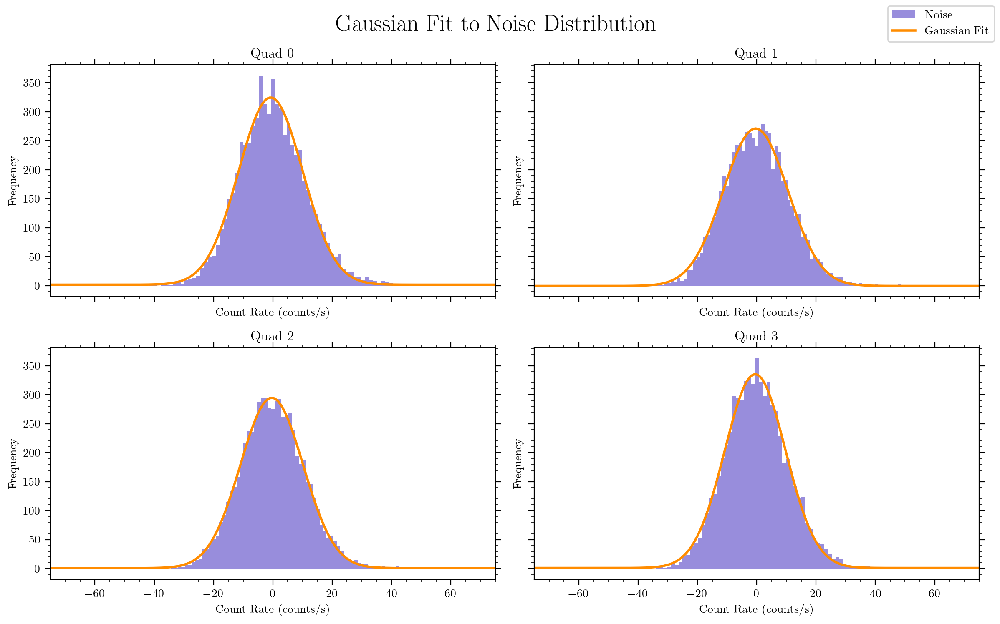

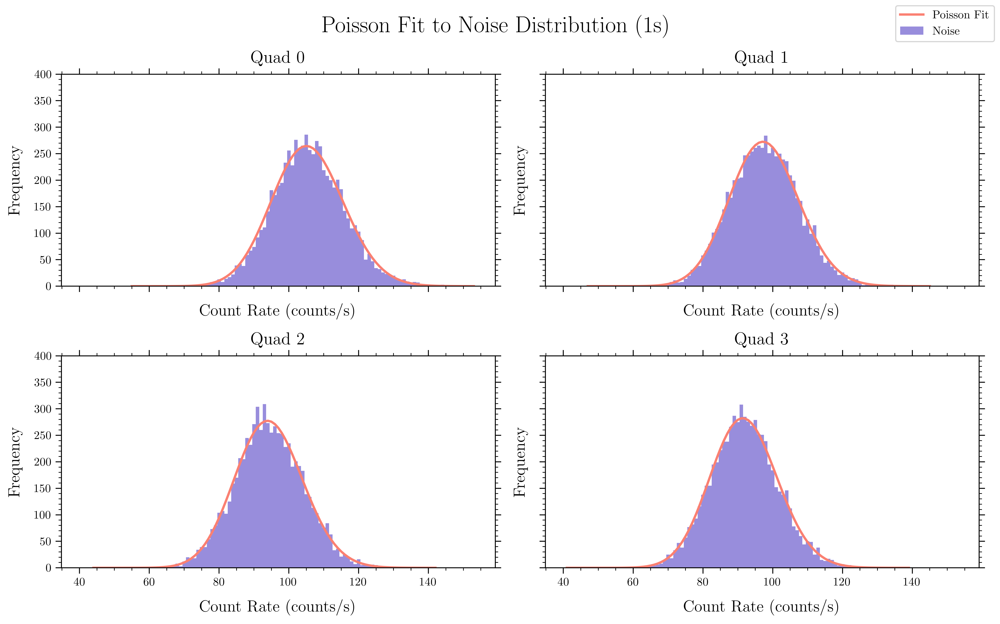

In [6]:
lc = [lc1, lc2, lc3, lc4]

p = ['Using RMS value of noise and peak value of signal', \
     'Using mean of absolute value of noise and peak value of signal', \
     'Adding the counts in the peak and noise regions', \
     'Modelling the noise as a Gaussian', \
     'Modelling the noise as a Poisson Distribution']

f = [snr_rms, snr_abs, snr_counts, snr_gauss, snr_poisson]

for i in range(5):
    print("Method " + str(i+1) + " - " + p[i])
    for j in range(4):
        if i==3 or i==4:
            print("The SNR of the GRB in Quad " + str(j) + " is " + str(f[i](lc[j], start, end)[0]))
        else:
            print("The SNR of the GRB in Quad " + str(j) + " is " + str(f[i](lc[j], start, end)))
    print("\n")


fig1, ax1 = plt.subplots(2,2, sharex=True, sharey=True, figsize=(12, 7.5), dpi=200)

for i in range(4):
    noise = snr_gauss(lc[i], start, end)[1]
    x = np.linspace(-75, 75, 200)
    popt = snr_gauss(lc[i], start, end)[3]
    ax1[i//2, i%2].hist(noise, bins=80, color='slateblue', label='Noise', alpha=0.69)
    ax1[i//2, i%2].plot(x, gaussian(x, *popt), color='darkorange', label='Gaussian Fit', linewidth=2)
    ax1[i//2, i%2].set_xlim(-75,75)
    ax1[i//2, i%2].set_title('Quad ' + str(i))
    ax1[i//2, i%2].set_xlabel('Count Rate (counts/s)')
    ax1[i//2, i%2].set_ylabel('Frequency')
fig1.legend(['Noise', 'Gaussian Fit'])
fig1.suptitle("Gaussian Fit to Noise Distribution", fontsize=20)
fig1.tight_layout()

fig5, ax5 = plt.subplots(2,2, sharex=True, sharey=True, figsize=(12, 7.5), dpi=500)

for i in range(4):
    _, n, x, popt = snr_poisson(lc[i], start, end)
    ax5[i//2, i%2].bar(x,n,color='slateblue',width=1, alpha=0.69, label='Noise')
    ax5[i//2, i%2].plot(x, poisson_fit(x, *popt), color='salmon', label='Poisson Fit', linewidth=2)
    ax5[i//2, i%2].set_xlabel("Count Rate (counts/s)", labelpad=10, fontsize=14)
    ax5[i//2, i%2].set_ylabel("Frequency", labelpad=10, fontsize=14)
    ax5[i//2, i%2].set_title("Quad " + str(i), pad=10, fontsize=15)
    ax5[i//2, i%2].set_ylim(0, 400)
fig5.legend(['Poisson Fit', 'Noise'])
fig5.suptitle("Poisson Fit to Noise Distribution (1s)", fontsize=20)
fig5.tight_layout()

# **Time binsize = 0.1s**

In [7]:
lc1_01 = 'data-0.1s/AS1A06_002T02_9000003206_21631cztM0_level2_quad_clean_Q0.lc'
lc2_01 = 'data-0.1s/AS1A06_002T02_9000003206_21631cztM0_level2_quad_clean_Q1.lc'
lc3_01 = 'data-0.1s/AS1A06_002T02_9000003206_21631cztM0_level2_quad_clean_Q2.lc'
lc4_01 = 'data-0.1s/AS1A06_002T02_9000003206_21631cztM0_level2_quad_clean_Q3.lc'

lc1_01_data = openlc(lc1_01)
lc2_01_data = openlc(lc2_01)
lc3_01_data = openlc(lc3_01)
lc4_01_data = openlc(lc4_01)

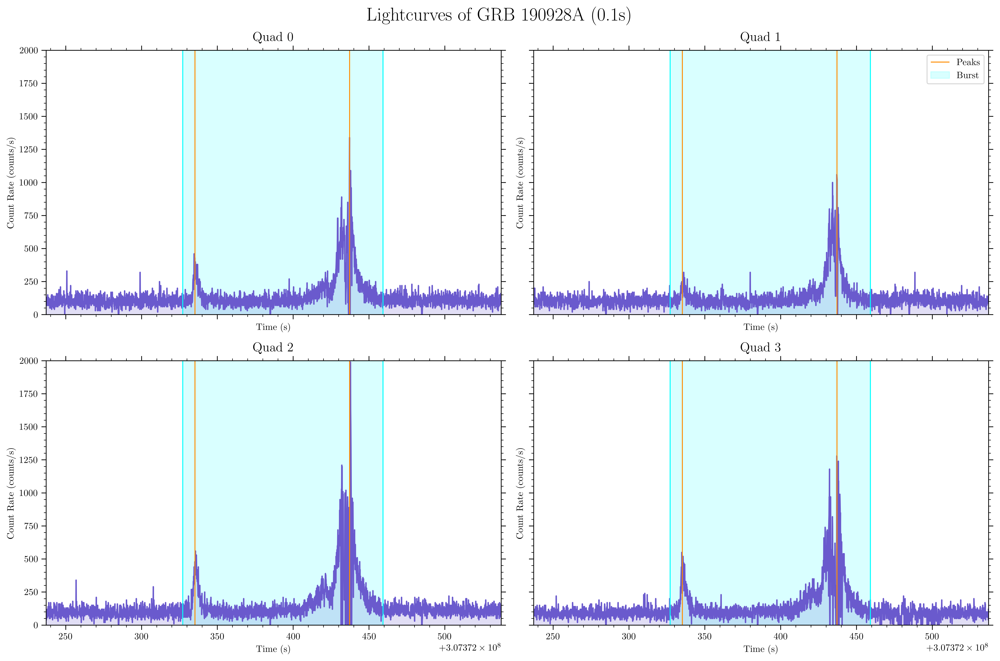

In [8]:
max_01 = int(np.where(lc1_01_data['RATE'] == np.max(lc1_01_data['RATE']))[0])
start_01 = max_01-1100
end_01 = max_01+220

l_01 = [lc1_01_data, lc2_01_data, lc3_01_data, lc4_01_data]

fig3, ax3 = plt.subplots(2,2, sharex=True, sharey=True, figsize=(15, 10), dpi=500)

for i in range(4):
    ax3[i//2,i%2].plot(l_01[i]['TIME'][start_01-900:end_01+780], l_01[i]['RATE'][start_01-900:end_01+780], color='slateblue')
    ax3[i//2, i%2].set_ylim(0, 2000)
    ax3[i//2, i%2].set_xlim(l_01[i]['TIME'][start_01-900], l_01[i]['TIME'][end_01+780])
    ax3[i//2,i%2].fill_between(l_01[i]['TIME'][start_01-900:end_01+780], l_01[i]['RATE'][start_01-900:end_01+780], color='slateblue', alpha=0.2)
    ax3[i//2,i%2].vlines(x = [l_01[i]['TIME'][max_01], l_01[i]['TIME'][max_01-1020]],ymin=0, ymax=2000, color = 'darkorange', label = 'Peaks', linewidth=1)
    ax3[i//2,i%2].vlines(x = [l_01[i]['TIME'][end_01], l_01[i]['TIME'][start_01]], ymin=0, ymax=2000, color = 'cyan', linewidth=1)
    ax3[i//2,i%2].fill_between(l_01[i]['TIME'][start_01:end_01], 2000, color='cyan', alpha=0.15, label='Burst')
    ax3[i//2,i%2].set_title('Quad '+str(i), fontsize=14, pad=10)
    ax3[i//2,i%2].set_xlabel('Time (s)')
    ax3[i//2,i%2].set_ylabel('Count Rate (counts/s)')
    if i//2==0 and i%2==1:
        ax3[i//2,i%2].legend()
        
fig3.suptitle('Lightcurves of GRB 190928A (0.1s)', fontsize=20)
fig3.tight_layout()

In [9]:
lc1_filtered_01, *_ = filter_and_detrend(lc1_01, start_01, end_01, 3, 1001)
lc2_filtered_01, *_ = filter_and_detrend(lc2_01, start_01, end_01, 3, 1001)
lc3_filtered_01, *_ = filter_and_detrend(lc3_01, start_01, end_01, 3, 1001)
lc4_filtered_01, *_ = filter_and_detrend(lc4_01, start_01, end_01, 3, 1001)

l_f_01 = [lc1_filtered_01, lc2_filtered_01, lc3_filtered_01, lc4_filtered_01]

fig5, ax5 = plt.subplots(4,1, sharex=True, sharey=True, figsize=(16,18), dpi=500)

for i in range(4):
    ax5[i].plot(l_f_01[i]['TIME'], l_f_01[i]['RATE'], color='slateblue')
    ax5[i].set_title('Quad '+str(i), fontsize=15, pad=10)
    ax5[i].set_xlabel('Time (s)', fontsize=13)
    ax5[i].set_ylabel('Count Rate (counts/s)', fontsize=13)
    ax5[i].set_xlim(np.min(l_f_01[i]['TIME']), np.max(l_f_01[i]['TIME']))
    
fig5.suptitle('Filtered Lightcurves of GRB 190928A (0.1s)', fontsize=20, y=0.99)
fig5.tight_layout()

Method 1 - Using RMS value of noise and peak value of signal
The SNR of the GRB in Quad 0 is 36.393322
The SNR of the GRB in Quad 1 is 28.260214
The SNR of the GRB in Quad 2 is 57.236927
The SNR of the GRB in Quad 3 is 37.248882


Method 2 - Using mean of absolute value of noise and peak value of signal
The SNR of the GRB in Quad 0 is 46.581493
The SNR of the GRB in Quad 1 is 36.134098
The SNR of the GRB in Quad 2 is 72.489365
The SNR of the GRB in Quad 3 is 47.670265


Method 3 - Adding the counts in the peak and noise regions
The SNR of the GRB in Quad 0 is 2.5198522415255984
The SNR of the GRB in Quad 1 is 1.775150678338402
The SNR of the GRB in Quad 2 is 3.517113909388305
The SNR of the GRB in Quad 3 is 3.171771656226526


Method 4 - Modelling the noise as a Gaussian
The SNR of the GRB in Quad 0 is 13.222091887696552
The SNR of the GRB in Quad 1 is 9.995721852708263
The SNR of the GRB in Quad 2 is 20.07347870531664
The SNR of the GRB in Quad 3 is 13.198597661488483


Method 5 - Mod

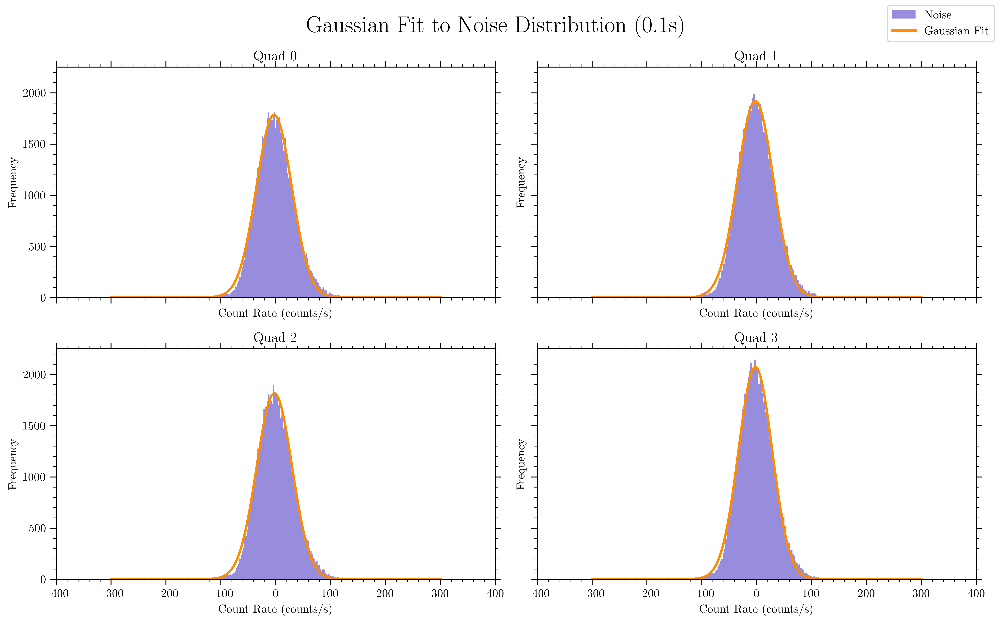

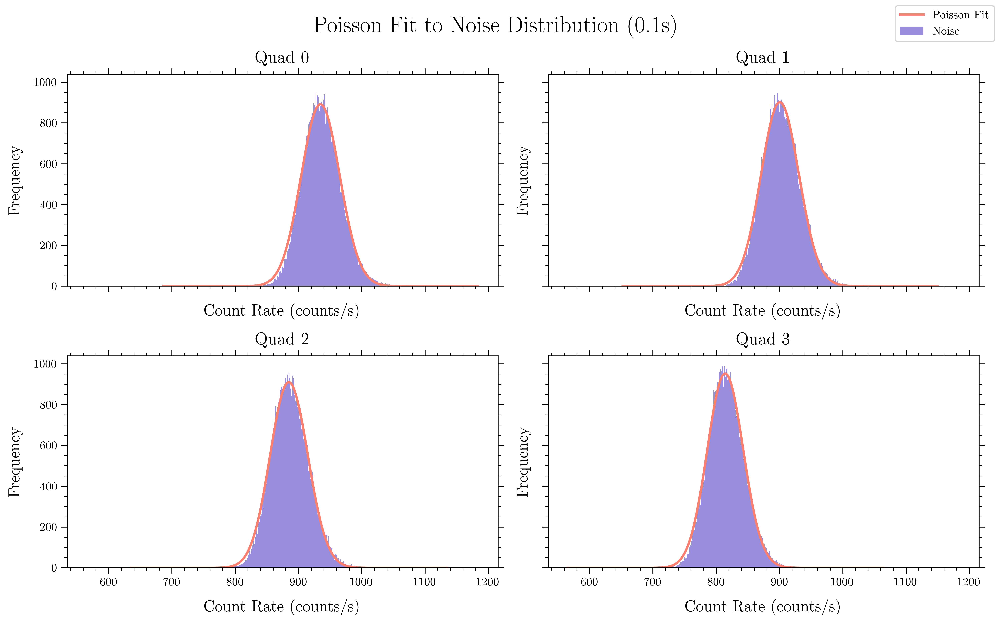

In [10]:
lc_01 = [lc1_01, lc2_01, lc3_01, lc4_01]

p_01 = ['Using RMS value of noise and peak value of signal', \
        'Using mean of absolute value of noise and peak value of signal', \
        'Adding the counts in the peak and noise regions', \
        'Modelling the noise as a Gaussian',\
        'Modelling the noise as a Poisson distribution']

f_01 = [snr_rms, snr_abs, snr_counts, snr_gauss, snr_poisson]

for i in range(5):
    print("Method " + str(i+1) + " - " + p_01[i])
    for j in range(4):
        if i==3 or i==4:
            print("The SNR of the GRB in Quad " + str(j) + " is " + str(f_01[i](lc_01[j], start_01, end_01)[0]))
        else:
            print("The SNR of the GRB in Quad " + str(j) + " is " + str(f_01[i](lc_01[j], start_01, end_01)))
    print("\n")

fig4, ax4 = plt.subplots(2,2, sharex=True, sharey=True, figsize=(12, 7.5), dpi=500)

for i in range(4):
    noise_01 = snr_gauss(lc_01[i], start_01, end_01)[1]
    x_01 = np.linspace(-300, 300, 200)
    popt_01 = snr_gauss(lc_01[i], start_01, end_01, in_bins=250)[3]
    ax4[i//2, i%2].hist(noise_01, bins=250, color='slateblue', label='Noise', alpha=0.69)
    ax4[i//2, i%2].plot(x_01, gaussian(x_01, *popt_01), color='darkorange', label='Gaussian Fit', linewidth=2)
    ax4[i//2, i%2].set_xlim(-400,400)
    ax4[i//2, i%2].set_title('Quad ' + str(i))
    ax4[i//2, i%2].set_xlabel('Count Rate (counts/s)')
    ax4[i//2, i%2].set_ylabel('Frequency')
fig4.legend(['Noise', 'Gaussian Fit'])
fig4.suptitle("Gaussian Fit to Noise Distribution (0.1s)", fontsize=20)
fig4.tight_layout()

fig5, ax5 = plt.subplots(2,2, sharex=True, sharey=True, figsize=(12, 7.5), dpi=500)

for i in range(4):
    _, n, x, popt = snr_poisson(lc_01[i], start_01, end_01, 500)
    ax5[i//2, i%2].bar(x,n,color='slateblue',width=1, alpha=0.69, label='Noise')
    ax5[i//2, i%2].plot(x, poisson_fit(x, *popt), color='salmon', label='Poisson Fit', linewidth=2)
    ax5[i//2, i%2].set_xlabel("Count Rate (counts/s)", labelpad=10, fontsize=14)
    ax5[i//2, i%2].set_ylabel("Frequency", labelpad=10, fontsize=14)
    ax5[i//2, i%2].set_title("Quad " + str(i), pad=10, fontsize=15)
fig5.legend(['Poisson Fit', 'Noise'])
fig5.suptitle("Poisson Fit to Noise Distribution (0.1s)", fontsize=20)
fig5.tight_layout()

# **Time Binsize=10s**

In [11]:
lc1_10 = 'data-10s/AS1A06_002T02_9000003206_21631cztM0_level2_quad_clean_Q0.lc'
lc2_10 = 'data-10s/AS1A06_002T02_9000003206_21631cztM0_level2_quad_clean_Q1.lc'
lc3_10 = 'data-10s/AS1A06_002T02_9000003206_21631cztM0_level2_quad_clean_Q2.lc'
lc4_10 = 'data-10s/AS1A06_002T02_9000003206_21631cztM0_level2_quad_clean_Q3.lc'

lc1_10_data = openlc(lc1_10)
lc2_10_data = openlc(lc2_10)
lc3_10_data = openlc(lc3_10)
lc4_10_data = openlc(lc4_10)

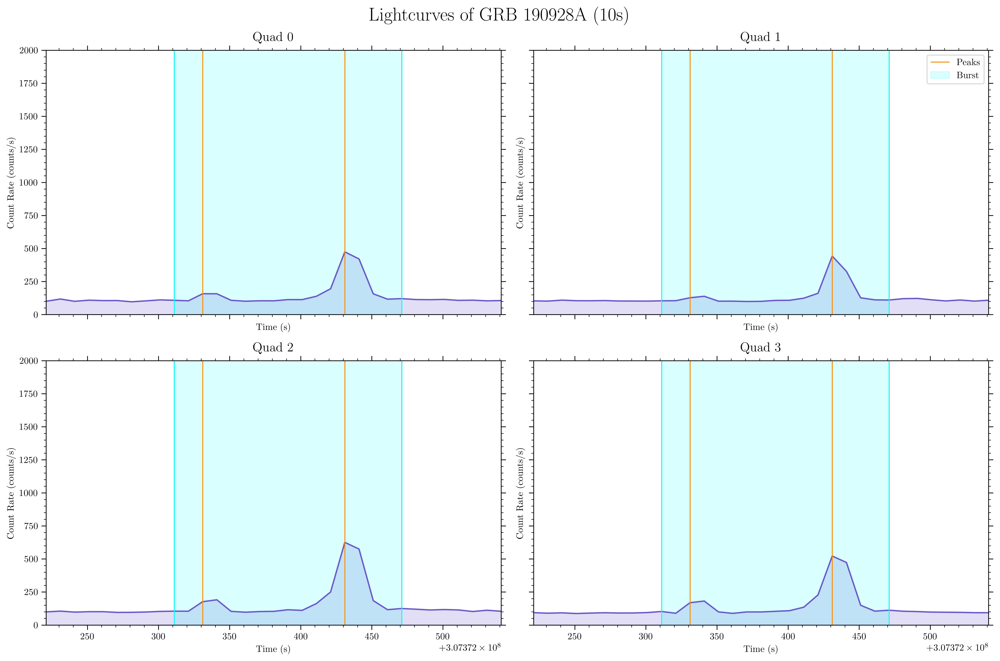

In [12]:
max_10 = int(np.where(lc1_10_data['RATE'] == np.max(lc1_10_data['RATE']))[0])
start_10 = max_10-12
end_10 = max_10+4

l_10 = [lc1_10_data, lc2_10_data, lc3_10_data, lc4_10_data]

fig6, ax6 = plt.subplots(2,2, sharex=True, sharey=True, figsize=(15, 10), dpi=500)

for i in range(4):
    ax6[i//2,i%2].plot(l_10[i]['TIME'][start_10-9:end_10+8], l_10[i]['RATE'][start_10-9:end_10+8], color='slateblue')
    ax6[i//2, i%2].set_ylim(0, 2000)
    ax6[i//2, i%2].set_xlim(l_10[i]['TIME'][start_10-9], l_10[i]['TIME'][end_10+7])
    ax6[i//2,i%2].fill_between(l_10[i]['TIME'][start_10-9:end_10+8], l_10[i]['RATE'][start_10-9:end_10+8], color='slateblue', alpha=0.2)
    ax6[i//2,i%2].vlines(x = [l_10[i]['TIME'][max_10], l_10[i]['TIME'][max_10-10]],ymin=0, ymax=2000, color = 'darkorange', label = 'Peaks', linewidth=1)
    ax6[i//2,i%2].vlines(x = [l_10[i]['TIME'][end_10], l_10[i]['TIME'][start_10]], ymin=0, ymax=2000, color = 'cyan', linewidth=1)
    ax6[i//2,i%2].fill_between(l_10[i]['TIME'][start_10:end_10+1], 2000, color='cyan', alpha=0.15, label='Burst')
    ax6[i//2,i%2].set_title('Quad '+str(i), fontsize=14, pad=10)
    ax6[i//2,i%2].set_xlabel('Time (s)')
    ax6[i//2,i%2].set_ylabel('Count Rate (counts/s)')
    if i//2==0 and i%2==1:
        ax6[i//2,i%2].legend()

fig6.suptitle('Lightcurves of GRB 190928A (10s)', fontsize=20)
fig6.tight_layout()

In [13]:
lc1_filtered_10, *_ = filter_and_detrend(lc1_10, start_10, end_10, 3, 11)
lc2_filtered_10, *_ = filter_and_detrend(lc2_10, start_10, end_10, 3, 11)
lc3_filtered_10, *_ = filter_and_detrend(lc3_10, start_10, end_10, 3, 11)
lc4_filtered_10, *_ = filter_and_detrend(lc4_10, start_10, end_10, 3, 11)

l_f_10 = [lc1_filtered_10, lc2_filtered_10, lc3_filtered_10, lc4_filtered_10]

fig7, ax7 = plt.subplots(4,1, sharex=True, sharey=True, figsize=(16,18), dpi=500)

for i in range(4):
    ax7[i].plot(l_f_10[i]['TIME'], l_f_10[i]['RATE'], color='slateblue')
    ax7[i].set_title('Quad '+str(i), fontsize=15, pad=10)
    ax7[i].set_xlabel('Time (s)', fontsize=13)
    ax7[i].set_ylabel('Count Rate (counts/s)', fontsize=13)

fig7.suptitle('Filtered Lightcurves of GRB 190928A (10s)', fontsize=20, y=0.99)
fig7.tight_layout()

Method 1 - Using RMS value of noise and peak value of signal
The SNR of the GRB in Quad 0 is 99.23856
The SNR of the GRB in Quad 1 is 101.026276
The SNR of the GRB in Quad 2 is 154.60832
The SNR of the GRB in Quad 3 is 146.8734


Method 2 - Using mean of absolute value of noise and peak value of signal
The SNR of the GRB in Quad 0 is 126.48643
The SNR of the GRB in Quad 1 is 128.60582
The SNR of the GRB in Quad 2 is 189.32841
The SNR of the GRB in Quad 3 is 182.34384


Method 3 - Adding the counts in the peak and noise regions
The SNR of the GRB in Quad 0 is 18.99217307281556
The SNR of the GRB in Quad 1 is 12.538440732211377
The SNR of the GRB in Quad 2 is 30.497076509515768
The SNR of the GRB in Quad 3 is 26.419740692246798


Method 4 - Modelling the noise as a gaussian
The SNR of the GRB in Quad 0 is 33.38358983185839
The SNR of the GRB in Quad 1 is 31.024616150915392
The SNR of the GRB in Quad 2 is 52.092495664408155
The SNR of the GRB in Quad 3 is 41.29991466426555


Method 5 - Mo

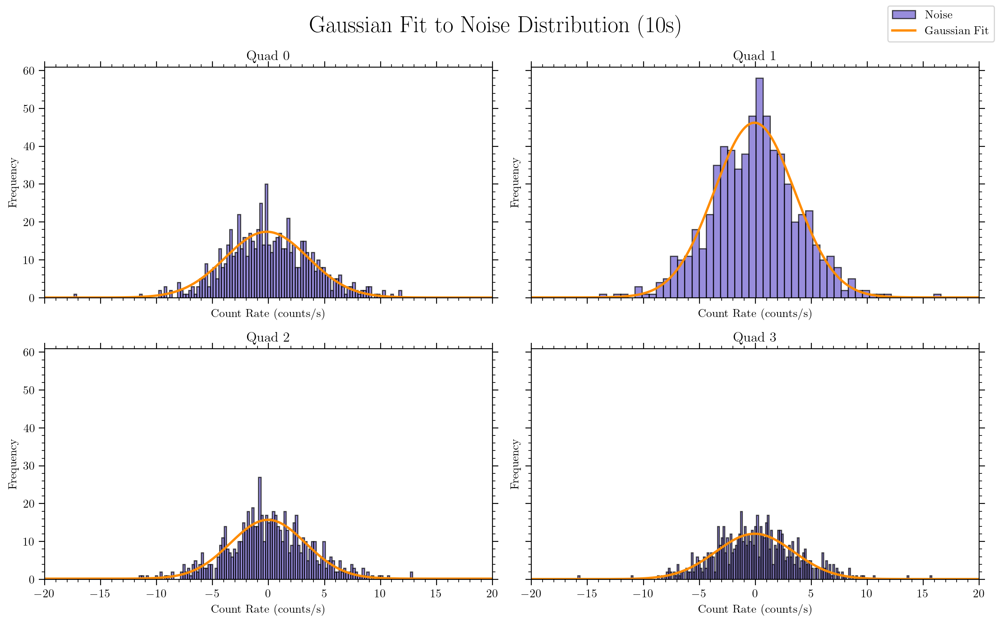

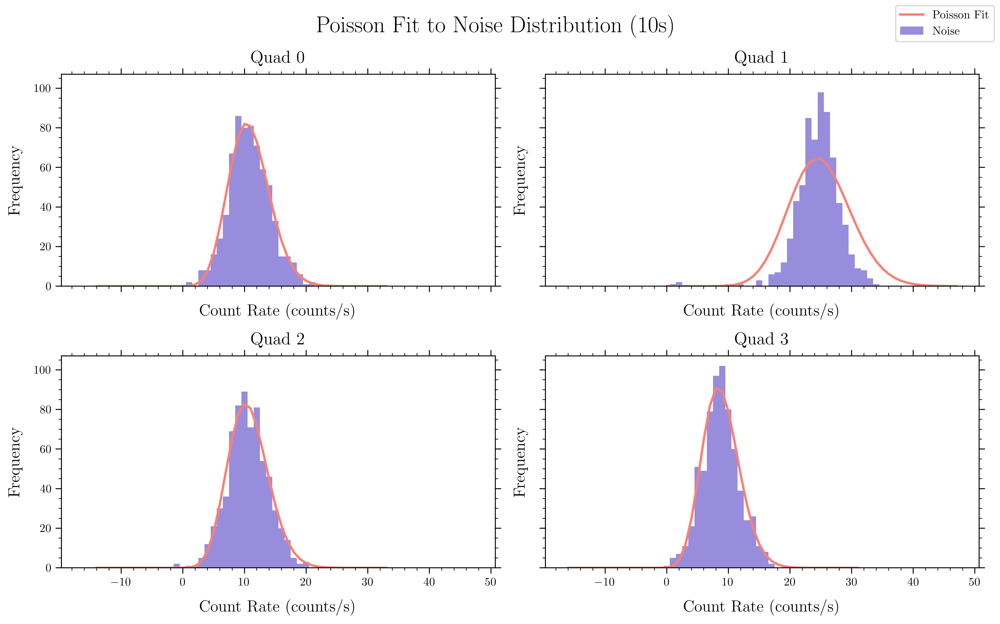

In [14]:
lc_10 = [lc1_10, lc2_10, lc3_10, lc4_10]

p_10 = ['Using RMS value of noise and peak value of signal', \
        'Using mean of absolute value of noise and peak value of signal', \
        'Adding the counts in the peak and noise regions', \
        'Modelling the noise as a gaussian', \
        'Modelling the noise as a Poisson distribution']

f_10 = [snr_rms, snr_abs, snr_counts, snr_gauss, snr_poisson]

for i in range(5):
    print("Method " + str(i+1) + " - " + p_10[i])
    for j in range(4):
        if i==3 or i==4:
            print("The SNR of the GRB in Quad " + str(j) + " is " + str(f_10[i](lc_10[j], start_10, end_10)[0]))
        else:
            print("The SNR of the GRB in Quad " + str(j) + " is " + str(f_10[i](lc_10[j], start_10, end_10)))
    print("\n")

fig8, ax8 = plt.subplots(2,2, sharex=True, sharey=True, figsize=(12, 7.5), dpi=200)

for i in range(4):
    noise_10 = snr_gauss(lc_10[i], start_10, end_10)[1]
    x_10 = np.linspace(-20, 20, 200)
    popt_10 = snr_gauss(lc_10[i], start_10, end_10, in_bins=200)[3]
    ax8[i//2, i%2].hist(noise_10, bins=200, color='slateblue', label='Noise', alpha=0.69, edgecolor='k')
    ax8[i//2, i%2].plot(x_10, gaussian(x_10, *popt_10), color='darkorange', label='Gaussian Fit', linewidth=2)
    ax8[i//2, i%2].set_xlim(-20,20)
    ax8[i//2, i%2].set_title('Quad ' + str(i))
    ax8[i//2, i%2].set_xlabel('Count Rate (counts/s)')
    ax8[i//2, i%2].set_ylabel('Frequency')
fig8.legend(['Noise', 'Gaussian Fit'])
fig8.suptitle("Gaussian Fit to Noise Distribution (10s)", fontsize=20)
fig8.tight_layout()

fig9, ax9 = plt.subplots(2,2, sharex=True, sharey=True, figsize=(12, 7.5), dpi=500)

for i in range(4):
    _, n, x, popt = snr_poisson(lc_10[i], start_10, end_10, 50)
    ax9[i//2, i%2].bar(x,n,color='slateblue',width=1, alpha=0.69, label='Noise')
    ax9[i//2, i%2].plot(x, poisson_fit(x, *popt), color='salmon', label='Poisson Fit', linewidth=2)
    ax9[i//2, i%2].set_xlabel("Count Rate (counts/s)", labelpad=10, fontsize=14)
    ax9[i//2, i%2].set_ylabel("Frequency", labelpad=10, fontsize=14)
    ax9[i//2, i%2].set_title("Quad " + str(i), pad=10, fontsize=15)
fig9.legend(['Poisson Fit', 'Noise'])
fig9.suptitle("Poisson Fit to Noise Distribution (10s)", fontsize=20)
fig9.tight_layout()

# **Results**
| Binsize | M1-RMS                                                       | M2-ABS                                                       | M3-Counts                                                | M4-Gaussian                                              |
|---------|--------------------------------------------------------------|--------------------------------------------------------------|----------------------------------------------------------|----------------------------------------------------------|
| 1s      | Q0-92.2635<br>Q1-77.45316<br>Q2-170.2916<br>Q3-102.11951     | Q0-116.68761<br>Q1-96.8198<br>Q2-212.06438<br>Q3-128.68777   | Q0-8.19773<br>Q1-5.85909<br>Q2-14.0777<br>Q3-11.6074     | Q0-32.59906<br>Q1-26.07514<br>Q2-56.25668<br>Q3-35.79486 |
| 0.1s    | Q0-36.393322<br>Q1-28.260214<br>Q2-57.236927<br>Q3-37.248882 | Q0-46.581493<br>Q1-36.134098<br>Q2-72.489365<br>Q3-47.670265 | Q0-2.519852<br>Q1-1.775150<br>Q2-3.517113<br>Q3-3.171771 | Q0-13.22209<br>Q1-9.995721<br>Q2-20.07347<br>Q3-13.19859 |
| 10s     | Q0-99.23856<br>Q1-101.026276<br>Q2-154.60832<br>Q3-146.8734  | Q0-126.48643<br>Q1-128.60582<br>Q2-189.32841<br>Q3-182.34384 | Q0-18.99217<br>Q1-12.53844<br>Q2-30.49707<br>Q3-26.41974 | Q0-33.38358<br>Q1-31.02461<br>Q2-52.09249<br>Q3-41.29991 |